# CSE 6367 Programming Assignment 3 (P3)

## Spring 2023

## Eigenfaces

In [38]:
import os
import cv2 as cv
import math
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn import decomposition
import operator
from functools import reduce

### Task 1 (30 points)
1. Load all the 25 images in the "/Eigenfaces/Train"
2. Display all the original faces in a 5X5 grid. Resize the images to 100X100 pixels for display only.
3. Find the mean face image. Perform PCA on the training faces.
4. Display the mean face. Resize the mean face to 100X100 pixels for display only
5. Diplay all the eigenfaces in a 5X5 grid.

In [39]:
def imageLoader(path):
  images = {}
  im2 = []

  for root, dirs, files in os.walk(path):
    path = root.split(os.sep)
    for index, file in enumerate(files):
        im2 = [ f for f in listdir(root) if isfile(join(root,f)) ]
        images[index] = join(root,im2[index])
  return images

In [40]:
def displayImages(images, rows, cols, sizeX, sizeY, paths = True): 
  fig=plt.figure(figsize=(50, 50))
  if paths:
    for j in range(0, cols*rows):
      fig.add_subplot(rows, cols, j+1)
      plt.imshow(cv.resize(cv.imread(images[j]), (sizeX, sizeY)), cmap = 'gray')
  else:
    for j in range(0, cols*rows):
      fig.add_subplot(rows, cols, j+1)
      plt.imshow(cv.resize(images[j], (sizeX, sizeY)), cmap = 'gray')
  plt.show()

In [41]:
def meanFaces(images, sizeX, sizeY):
  mean_face = np.zeros((sizeX, sizeY))
  n = len(images)
  w = 1/n
  for i in range(0, n):
    mean_face += w*cv.cvtColor(cv.imread(images[i]), cv.COLOR_BGR2GRAY)
  return mean_face

In [42]:
def eigenFaces(images, mean_face, k = 25):
  img_list = []
  eigen_faces = []
  for i in range(0, len(images)):
    centered_face = cv.cvtColor(cv.imread(images[i]), cv.COLOR_RGB2GRAY) - mean_face
    img_list.append(np.ndarray.flatten(centered_face))
  
  centered_faces = np.array(img_list)

  e_val, e_vec = np.linalg.eig(np.dot(centered_faces, centered_faces.T))

  face_list = np.dot(e_vec[:k, :].T, centered_faces[:k, :])

  for i in face_list:
    eigen_faces.append(np.reshape(i, (425, 425)) + mean_face)

  return np.array(eigen_faces)

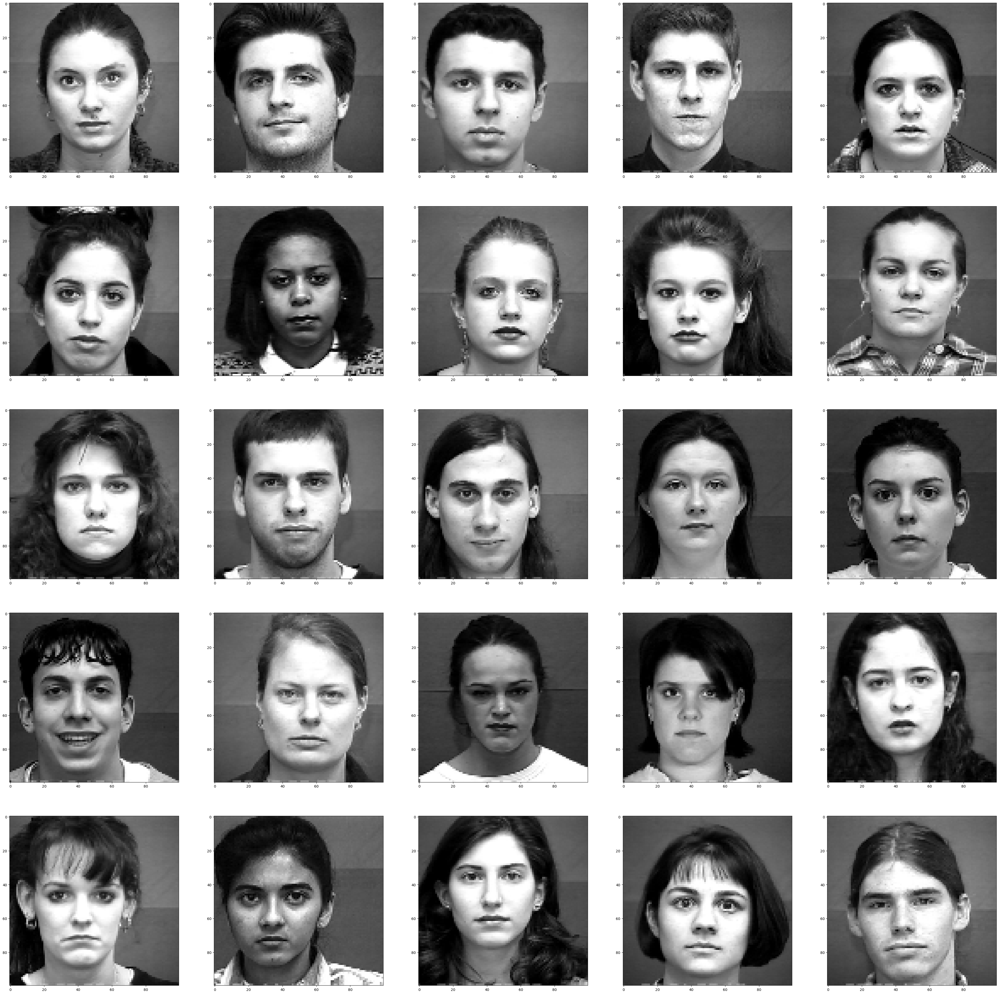

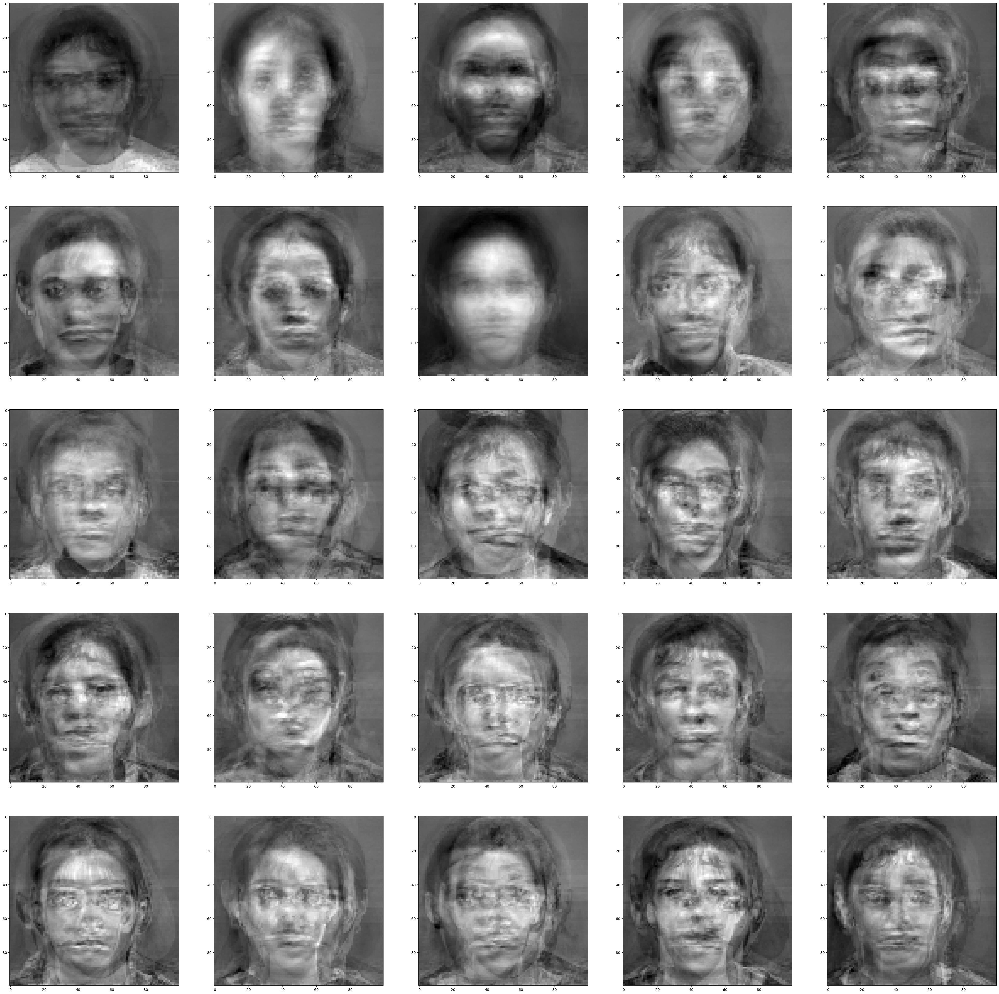

In [43]:
train_images = imageLoader("./Eigenfaces/Train/")
displayImages(train_images, 5, 5, 100, 100)
mf = meanFaces(train_images, 425, 425)
e_faces = eigenFaces(train_images, mf)
displayImages(e_faces, 5, 5, 100, 100, False)

### Task 2 (30 points)

1. Select k = 2 eigenfaces (eigenvectors that correspond to the largest eigenvalues).
2. Reconstruct the training faces and display the reconstructed faces in a 5X5 grid.
3. Repeat the process for k = 5 and k = 15. For each k, reconstruct the training faces and display the reconstructed image in a 5X5 grid.

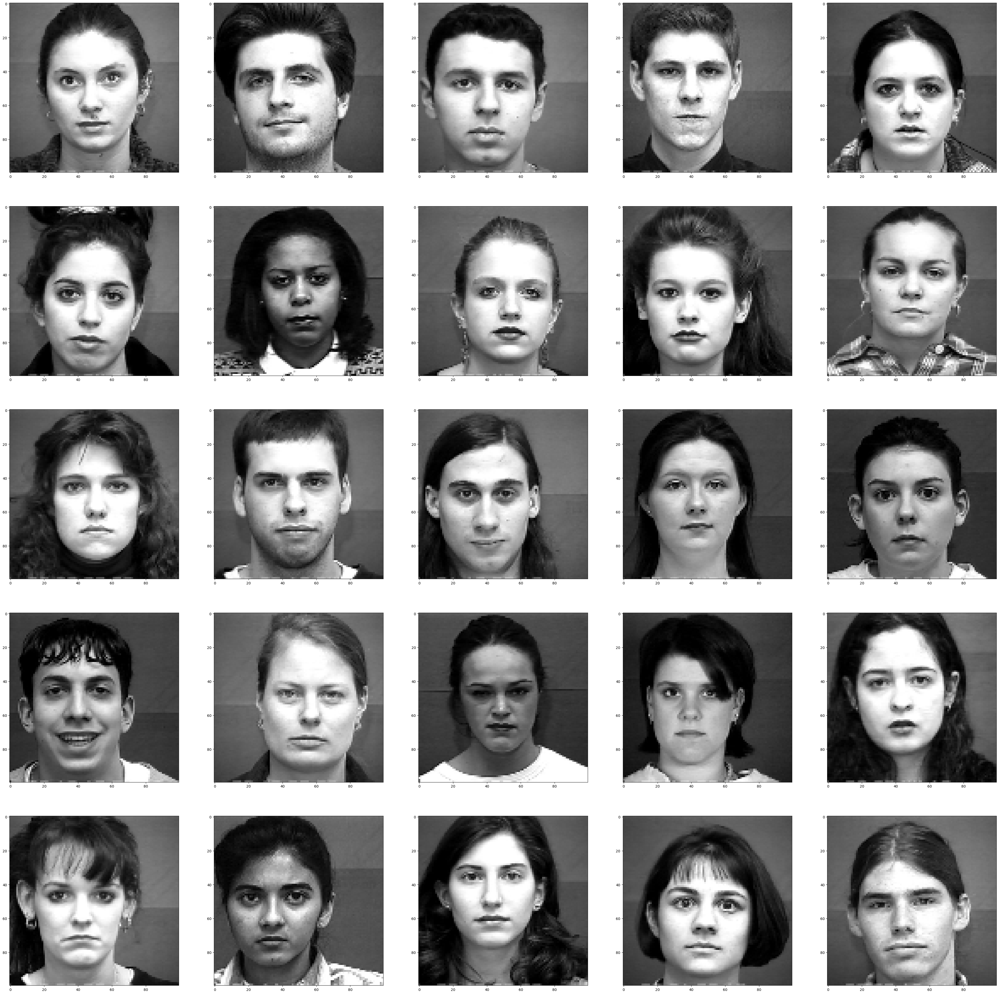

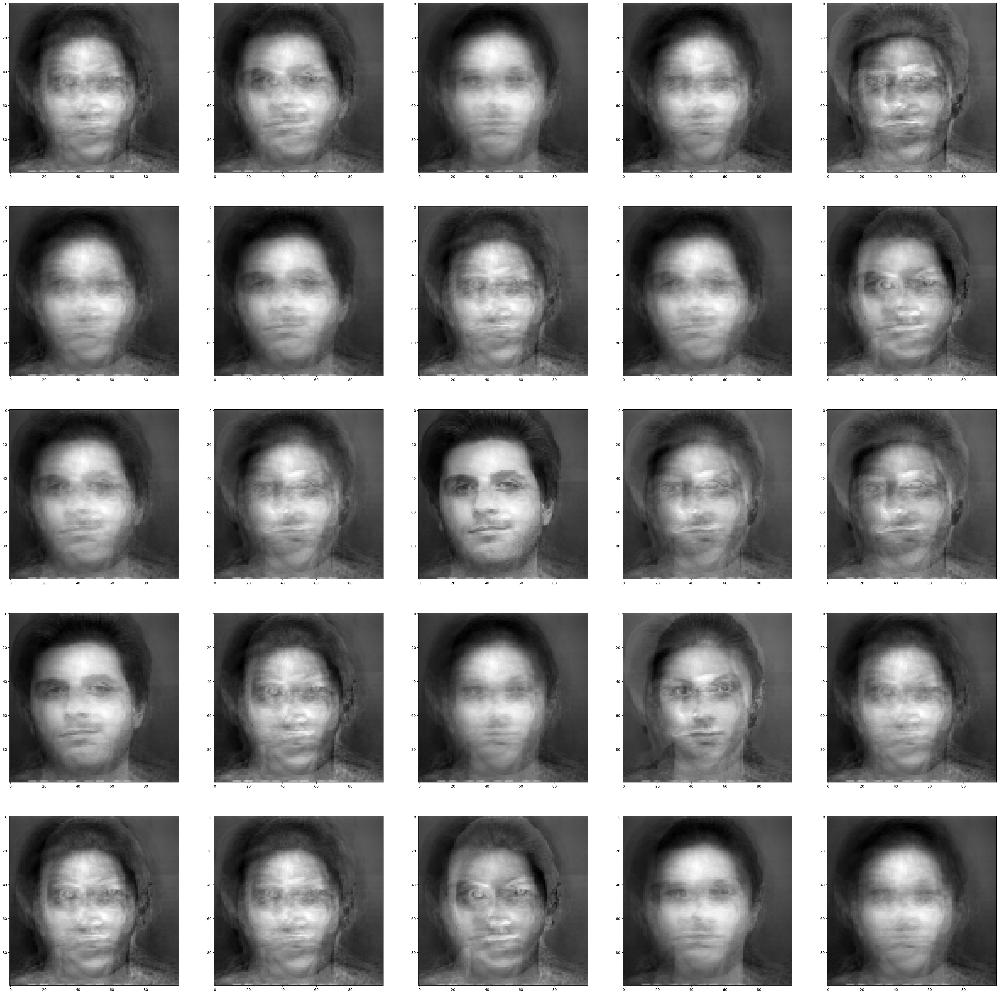

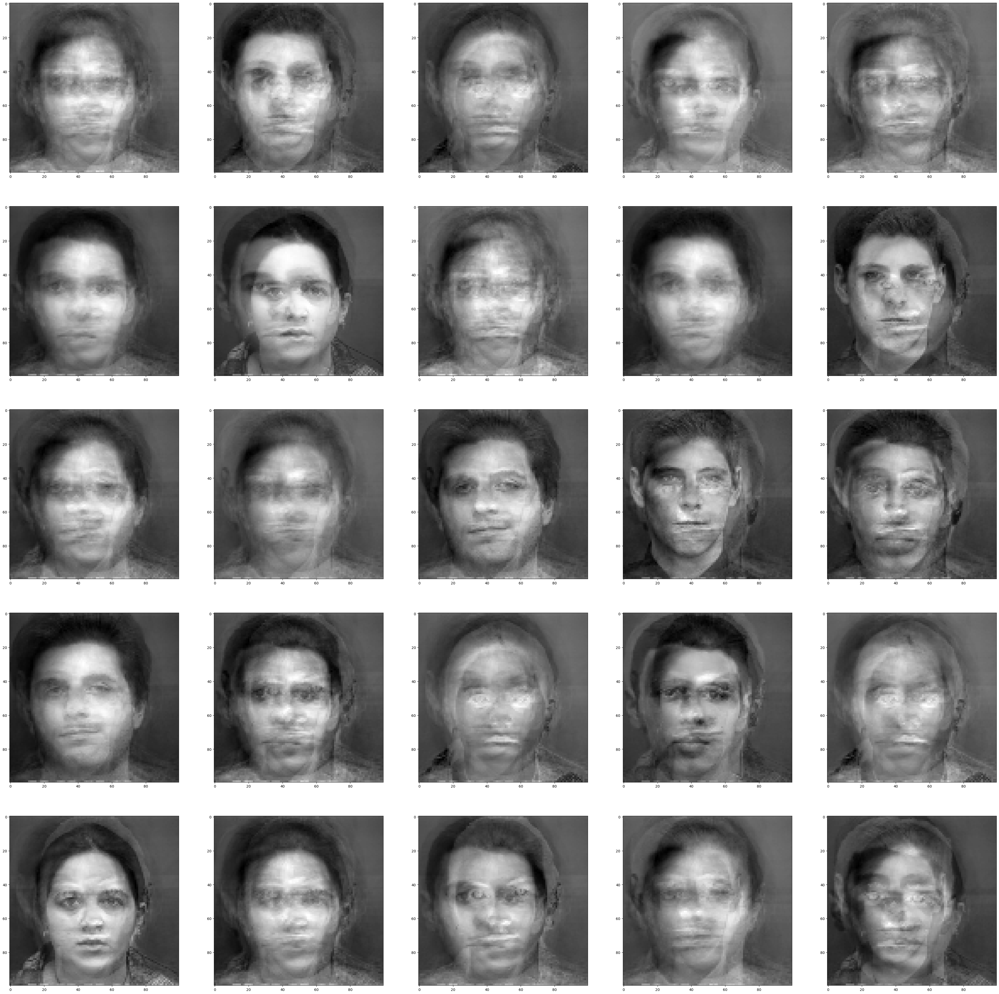

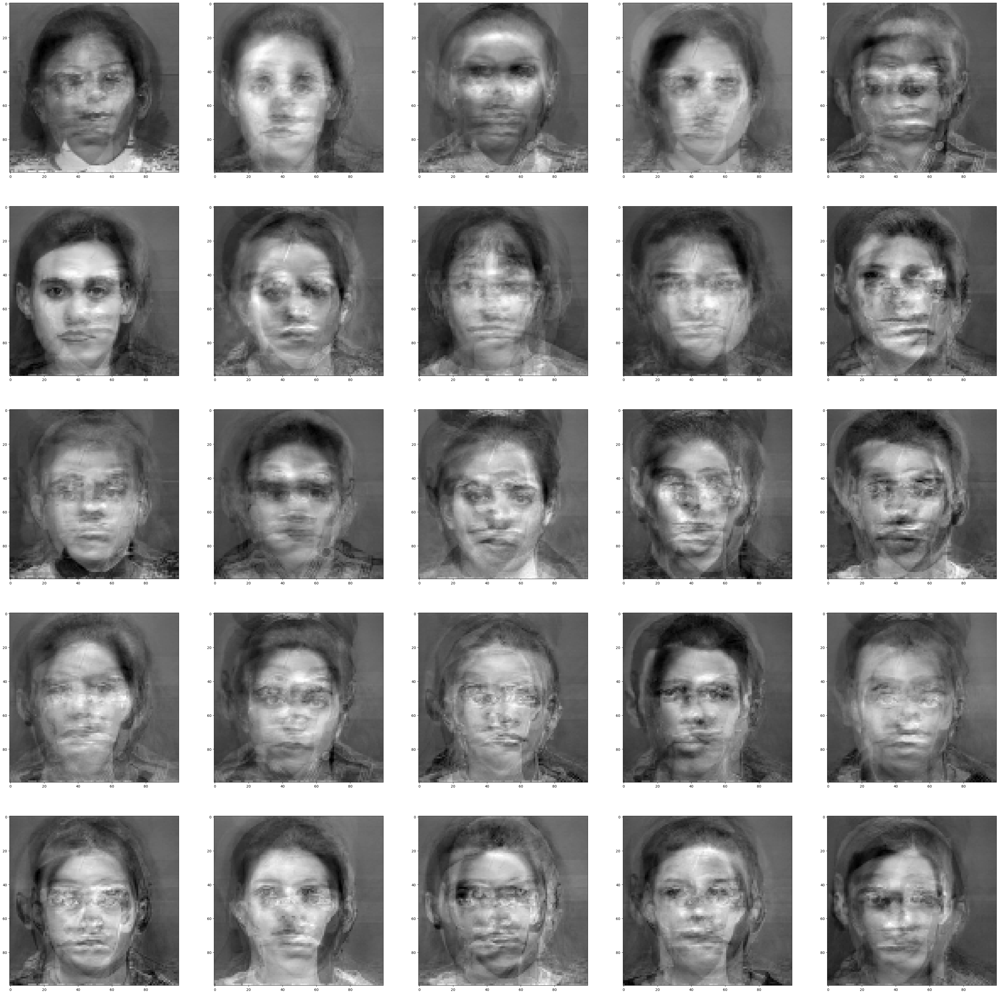

In [44]:
train_images = imageLoader("./Eigenfaces/Train/")
displayImages(train_images, 5, 5, 100, 100)
mf = meanFaces(train_images, 425, 425)
e_faces = eigenFaces(train_images, mf, 2)
displayImages(e_faces, 5, 5, 100, 100, False)
e_faces = eigenFaces(train_images, mf, 5)
displayImages(e_faces, 5, 5, 100, 100, False)
e_faces = eigenFaces(train_images, mf, 15)
displayImages(e_faces, 5, 5, 100, 100, False)

### Task 3 (40 points)
1. Load all the test images from "/Eigenfaces/Test"
2. Project each image on the k = 2 eigenvectors and find if it's a face. If it's a face, find it's closest training image. Use euclidean distance to calculate distance.
3. Display all the results in an M X 2 table, where M is total no of test images. Each row of the table displays two images. The image on the left is the test image. The image on the right is it's closest image in the eigenfaces space. If an image is classified as a non-face, then the second column in the table should be blank.
4. Repeat the process and display the results for k = 5, k = 15.

In [45]:
def closestFace(train, test):
  error_list = []
  error_array = []
  for i, test_image in enumerate(test):
    for j, train_image in enumerate(train):
      error = np.sum(np.square(test_image-train_image))
      error_array.append(error)
    error_list.append([i, error_array.index(min(error_array))])
    error_array = []
  return error_list

In [46]:
def getImages(indexes, train, test):
  train_images = []
  test_images = []
  for i, j in indexes:
    test_images.append(test[i])
    train_images.append(train[j])
  return np.array(train_images), np.array(test_images)

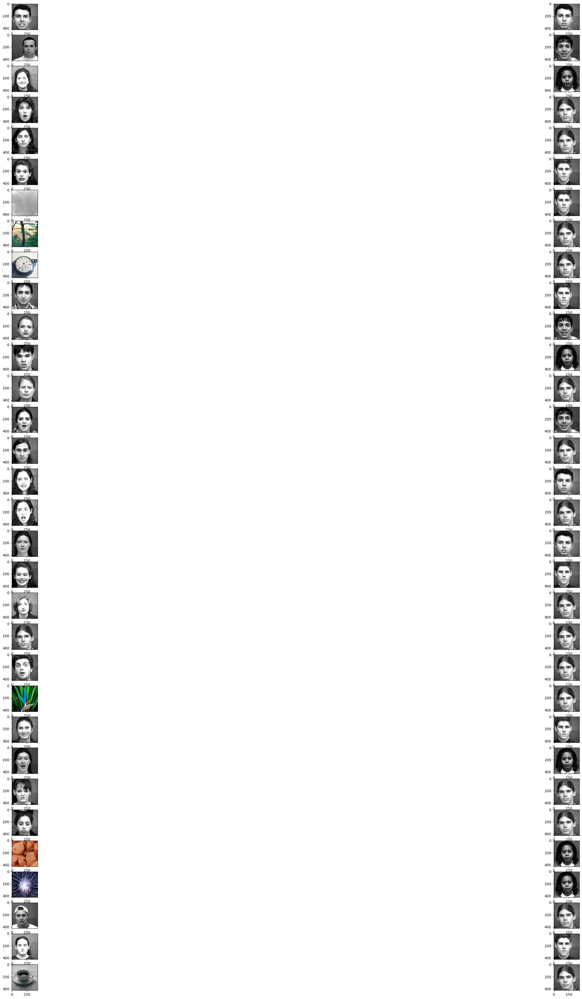

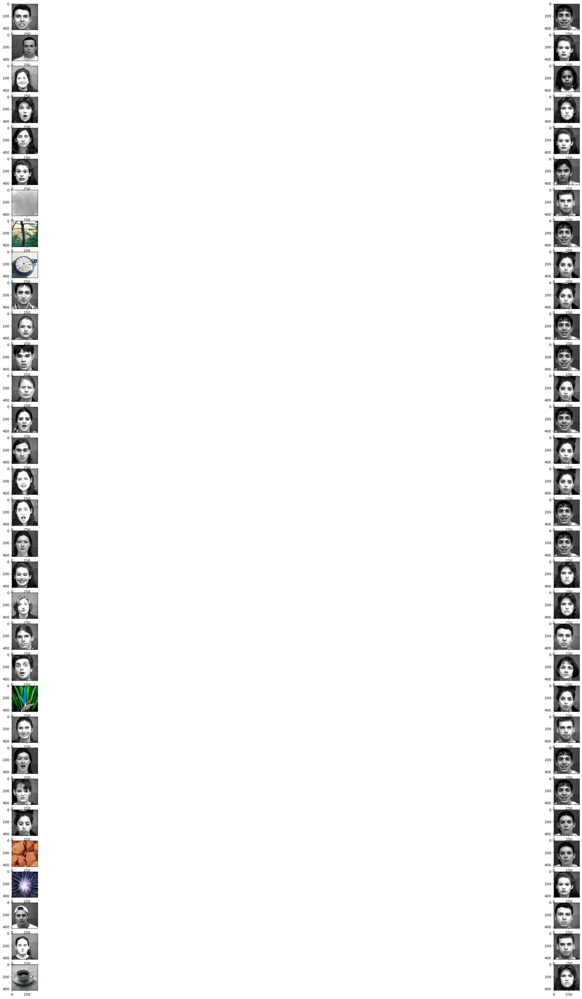

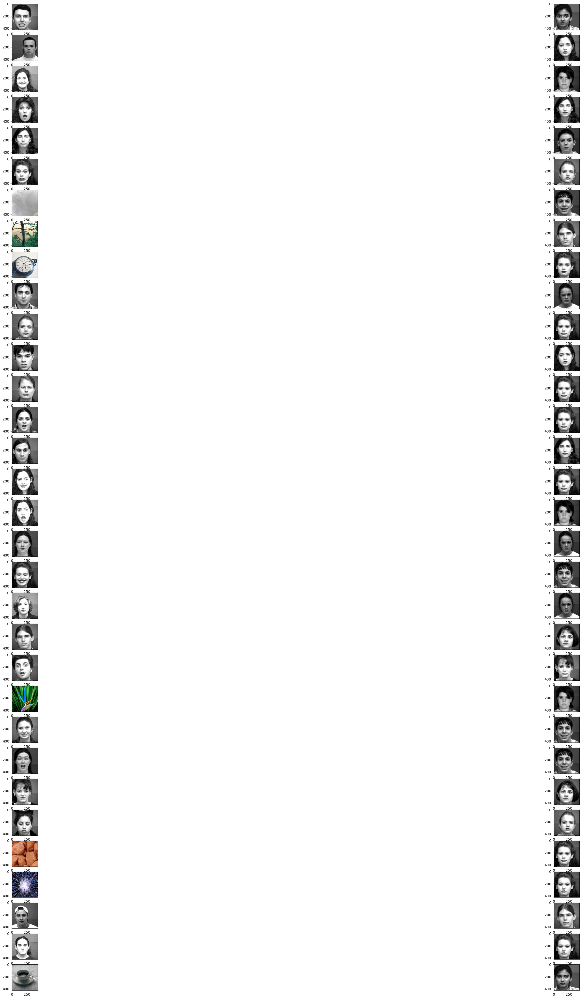

In [47]:
test_images = imageLoader("./Eigenfaces/Test/")
train_images = imageLoader("./Eigenfaces/Train/")
mf_train = meanFaces(train_images, 425, 425)
e_faces_train = eigenFaces(train_images, mf_train, 2)
mf_test = meanFaces(train_images, 425, 425)
e_faces_test = eigenFaces(test_images, mf_test, 2)
indexes = closestFace(e_faces_train, e_faces_test)
tr, te = getImages(indexes, train_images, test_images)
images = reduce(operator.add, zip(te, tr))
displayImages(images, len(te), 2, 425, 425, True)
e_faces_train = eigenFaces(train_images, mf_train, 5)
mf_test = meanFaces(train_images, 425, 425)
e_faces_test = eigenFaces(test_images, mf_test, 5)
indexes = closestFace(e_faces_train, e_faces_test)
tr, te = getImages(indexes, train_images, test_images)
images = reduce(operator.add, zip(te, tr))
displayImages(images, len(te), 2, 425, 425, True)
e_faces_train = eigenFaces(train_images, mf_train, 15)
mf_test = meanFaces(train_images, 425, 425)
e_faces_test = eigenFaces(test_images, mf_test, 15)
indexes = closestFace(e_faces_train, e_faces_test)
tr, te = getImages(indexes, train_images, test_images)
images = reduce(operator.add, zip(te, tr))
displayImages(images, len(te), 2, 425, 425, True)

### Submission Guidelines:
    Submit through Canvas your source code in a single .ipynb file. The name of the .ipynb file should be YourStudentID.ipynb. (For example: 1001234567.ipynb)
    Import all the images from the ./Eigenfaces directory. Your TA will use the same directory name to grade your submission.
    You don't need to attach the dataset with your submission.

Assignment Courtesy: Prof. Farhad Kamangar, CSE@UTA